In [1]:
import visual_behavior_glm.src.GLM_params as glm_params
import visual_behavior_glm.src.GLM_analysis_tools as gat
import visual_behavior_glm.src.GLM_visualization_tools as gvt
from visual_behavior_glm.src.glm import GLM
import matplotlib.pyplot as plt
import visual_behavior.data_access.loading as loading
import visual_behavior.database as db
import plotly.express as px

import pandas as pd
import numpy as np
import os

import seaborn as sns

import visual_behavior.plotting as vbp

import plotly.express as px
from sklearn.cluster import KMeans
import umap

/home/dougo/Code/AllenSDK/allensdk/brain_observatory/behavior/behavior_ophys_api/behavior_ophys_nwb_api.py:9: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


In [2]:
%matplotlib notebook
%widescreen

# Gather/organize data

## load the results summary for a single GLM version from mongo

In [3]:
rs = gat.retrieve_results(search_dict = {'glm_version': '4_L2_optimize_by_cell'}, results_type='summary')
rs.sample(10)

,_id,index,dropout,variance_explained,fraction_change_from_full,absolute_change_from_full,cell_specimen_id,ophys_experiment_id,ophys_session_id,behavior_session_id,container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,session_type,equipment_name,date_of_acquisition,isi_experiment_id,specimen_id,sex,age_in_days,full_genotype,reporter_line,driver_line,imaging_depth,targeted_structure,published_at,super_container_id,cre_line,session_tags,failure_tags,exposure_number,model_outputs_available,location,glm_version,entry_time_utc
971500,5f245de428e5b4ae1ab35bf9,12,correct_rejects,0.010181,0.056225,0.000542,1007035181,936494970,935554523,935653479,930024022,VisualBehavior,container_qc,passed,20190830_459773_3imagesA,OPHYS_3_images_A,CAM2P.5,2019-08-30 15:56:52.000000,863334770,854612265,F,175.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,854612265,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:07:32.602948
319739,5f22290ae11e3b58e9e37fec,27,model_omissions1,0.009321,0.055722,0.000492,1017239585,994082680,993962221,993984422,1018027787,VisualBehaviorMultiscope,completed,passed,20191212_485152_Ophys4_retake,OPHYS_4_images_B,MESO.1,2019-12-12 11:01:10.923267,949762677,935565389,M,154.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",171,VISl,NaN,935565389,Slc17a7-IRES2-Cre,NaN,NaN,1,1,Slc17a7_VISl_171,4_L2_optimize_by_cell,2020-07-31 18:08:14.150640
372665,5f2229ef73ad3d87da617de2,15,running,0.737381,0.001791,0.001318,1028793772,906910627,906521029,906658064,1018027657,VisualBehaviorMultiscope,completed,passed,20190715_456915_Ophys4,OPHYS_4_images_B,MESO.1,2019-07-15 11:15:20.640855,852260338,843122504,F,144.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",75,VISl,NaN,843122504,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_75,4_L2_optimize_by_cell,2020-07-31 18:09:23.902456
778382,5f223d78d1441ed03500f984,14,image_expectation,0.005119,0.049750,0.000243,1007032391,965218395,964691111,964894591,947838486,VisualBehaviorTask1B,container_qc,passed,20191010_476067_6imagesA,OPHYS_6_images_A,CAM2P.5,2019-10-10 15:52:31.000000,921634717,912554454,F,135.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,912554454,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:16:23.248892
835494,5f223f9f472a5282aefcccba,6,post_lick_bouts,0.097262,0.004579,0.000443,962590172,796105304,796019065,796031509,814796612,VisualBehavior,container_qc,passed,20181215_412366_6imagesB,OPHYS_6_images_B,CAM2P.4,2018-12-15 16:59:41.000000,765187424,756674785,F,152.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",375,VISp,NaN,756674785,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_375,4_L2_optimize_by_cell,2020-07-31 18:18:27.000632
1258026,5f246139df72c0113e70b38c,26,model_task0,0.103215,0.026161,0.002631,961903257,825120601,824433631,824625446,803516615,VisualBehavior,container_qc,passed,20190218_423606_4imagesB,OPHYS_4_images_B,CAM2P.3,2019-02-18 15:56:53.000000,774563995,766015390,M,156.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,['Ai94(TITL-GCaMP6s)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,766015390,Slc17a7-IRES2-Cre,NaN,NaN,1,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:21:45.094931
334360,5f22296ac3c02b2ee6ab2280,25,model_bias,0.198950,0.003505,0.000695,1007949388,1008318518,1008005573,1008030870,1006071814,VisualBehavior,holding,passed,20200218_495789_4ImagesB,OPHYS_4_images_B,CAM2P.3,2020-02-18 16:45:58.000000,985894742,975406504,M,160.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],275,VISp,NaN,975406504,Sst-IRES-Cre,NaN,NaN,0,1,Sst_VISp_275,4_L2_optimize_

## get a list of columns to use for clustering. Defining this list now makes it easier to avoid accidentally clustering on some identifying feature (e.g., cre_line, session_type, etc.)
I'm removing the 'visual' dropout, since it's actually a combination of the omission and all-images dropouts.

In [4]:
cols_for_clustering = list(rs['dropout'].unique())
cols_for_clustering.remove('visual')
cols_for_clustering

['Full',
 'intercept',
 'time',
 'pre_licks',
 'post_licks',
 'pre_lick_bouts',
 'post_lick_bouts',
 'rewards',
 'change',
 'hits',
 'misses',
 'false_alarms',
 'correct_rejects',
 'omissions',
 'image_expectation',
 'running',
 'pupil',
 'image0',
 'image1',
 'image2',
 'image3',
 'image4',
 'image5',
 'image6',
 'image7',
 'model_bias',
 'model_task0',
 'model_omissions1',
 'model_timing1D',
 'all-images',
 'beh_model']

## build a pivoted version of the results summary, using the `fraction_change_from_full` column as the values.

In [5]:
rsp = gat.build_pivoted_results_summary(results_summary=rs, cutoff=0.01, value_to_use='fraction_change_from_full')

## add a `session_id` column with a numeric value for the session_type (to lump together sessions by order, regardless of image set)

In [6]:
def map_session_types(session_type):
    session_id = int(session_type[6:7])
    return session_id
rsp['session_id'] = rsp['session_type'].map(lambda st:map_session_types(st))

rsp

,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,image2,image3,image4,image5,image6,image7,image_expectation,intercept,misses,model_bias,model_omissions1,model_task0,model_timing1D,omissions,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual,cell_specimen_id,ophys_experiment_id,ophys_session_id,behavior_session_id,container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,session_type,equipment_name,date_of_acquisition,isi_experiment_id,specimen_id,sex,age_in_days,full_genotype,reporter_line,driver_line,imaging_depth,targeted_structure,published_at,super_container_id,cre_line,session_tags,failure_tags,exposure_number,model_outputs_available,location,glm_version,session_id
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,0.002692,0.001819,0.003621,-0.001186,-0.026248,0.002645,0.000947,0.000913,-0.001280,-0.001924,0.000501,-0.000538,0.000135,0.008544,0.007587,-0.005937,0.011424,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425,1003146172,1000743008,1000580083,1000600602,999191979,VisualBehaviorTask1B,holding,passed,20200116_489056_1imagesB,OPHYS_1_images_B,CAM2P.3,2020-01-16 18:49:41.000000,962029605,951667115,M,165.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],275,VISp,NaN,951667115,Sst-IRES-Cre,NaN,NaN,0,1,Sst_VISp_275,4_L2_optimize_by_cell,1
1,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,-0.007203,-0.007210,0.002283,-0.018611,0.002152,0.002657,0.000976,0.000081,0.006030,0.000728,0.001277,0.000856,0.002049,0.020436,0.001011,0.003103,0.031004,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412,1003146180,1000743008,1000580083,1000600602,999191979,VisualBehaviorTask1B,holding,passed,20200116_489056_1imagesB,OPHYS_1_images_B,CAM2P.3,2020-01-16 18:49:41.000000,962029605,951667115,M,165.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],275,VISp,NaN,951667115,Sst-IRES-Cre,NaN,NaN,0,1,Sst_VISp_275,4_L2_optimize_by_cell,1
2,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,-0.015761,0.000383,0.000302,-0.012279,0.008475,0.001058,-0.001232,-0.002156,0.000572,0.010619,0.029392,-0.001927,0.021750,-0.000316,-0.004966,0.002149,0.003036,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959,1003146183,1000743008,1000580083,1000600602,999191979,VisualBehaviorTask1B,holding,passed,20200116_489056_1imagesB,OPHYS_1_images_B,CAM2P.3,2020-01-16 18:49:41.000000,962029605,951667115,M,165.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],275,VISp,NaN,951667115,Sst-IRES-Cre,NaN,NaN,0,1,Sst_VISp_275,4_L2_optimize_by_cell,1
3,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,0.000206,-0.049498,0.001615,-0.021775,0.000046,0.002221,-0.003134,0.003374,0.002284,0.014580,0.006673,0.005393,-0.001058,0.002760,-0.001018,0.000574,0.004443,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852,1003146186,1000743008,1000580083,1000600602,999191979,VisualBehaviorTask1B,holding,passed,20200116_489056_1imagesB,OPHYS_1_images_B,CAM2P.3,2020-01-16 18:49:41.000000,962029605,951667115,M,165.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],275,VISp,NaN,951667115,Sst-IRES-Cre,NaN,NaN,0,1,Sst_VISp_275,4_L2_optimize_by_cell,1
4,1000743008_1003146190,0.0,-0.089674,0.000823,0.000713,0.027508,0.019429,0.006967,0.006088,0.004045,-0.003198,-0.024926,0.003739,0.002454,-0.000550,0.008610,0.001467,0.000038,0.000181,-0.000054,0.001188,0.000657,-0.001699,0.031173,0.010330,0.005812,0.031873,0.030949,-0.019613,0.021468,0.005709,0.000490,-0.184349,1003146190,1000743008,1000580083,1000600602,999191979,VisualBehaviorTask1B,holding,passed,20200116_489056_1imagesB,OPHYS_1_images_B

## Turn some categorical columns into numerical columns

In [7]:
def make_categorical(df, column):
    df['{}_categorical'.format(column)] = pd.Categorical(df[column], ordered=True).codes

for column in ['cre_line','equipment_name','targeted_structure','session_id']:
    make_categorical(rsp, column)


# Dimensionality reduction and clustering
So many more things to try here. This is just a start.

## UMAP

In [8]:
reducer_2d = umap.UMAP(n_components=2)
reducer_3d = umap.UMAP(n_components=3)


embedding_2d = reducer_2d.fit_transform(rsp[cols_for_clustering])
embedding_3d = reducer_3d.fit_transform(rsp[cols_for_clustering])

# add umap embeddings to datafr
rsp['umap_3d_embedding_0'] = embedding_3d[:, 0]
rsp['umap_3d_embedding_1'] = embedding_3d[:, 1]
rsp['umap_3d_embedding_2'] = embedding_3d[:, 2]

rsp['umap_2d_embedding_0'] = embedding_2d[:, 0]
rsp['umap_2d_embedding_1'] = embedding_2d[:, 1]

/home/dougo/.conda/envs/visual_behavior/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


## k-means clustering on 3d umap

In [9]:

kmeans = KMeans(n_clusters=20)
umap_cols = ['umap_3d_embedding_0','umap_3d_embedding_1','umap_3d_embedding_2']
rsp['k_means_on_3d_umap'] = kmeans.fit_predict(rsp[umap_cols])
rsp['k_means_on_3d_umap'].value_counts()

5     1796
8     1736
18    1712
12    1661
17    1632
10    1620
6     1619
13    1591
4     1543
16    1521
9     1460
7     1346
2     1291
3     1195
11    1190
19     967
1      740
14     739
15     734
0      702
Name: k_means_on_3d_umap, dtype: int64

## visualize in 2d using matplotlib

<IPython.core.display.Javascript object>


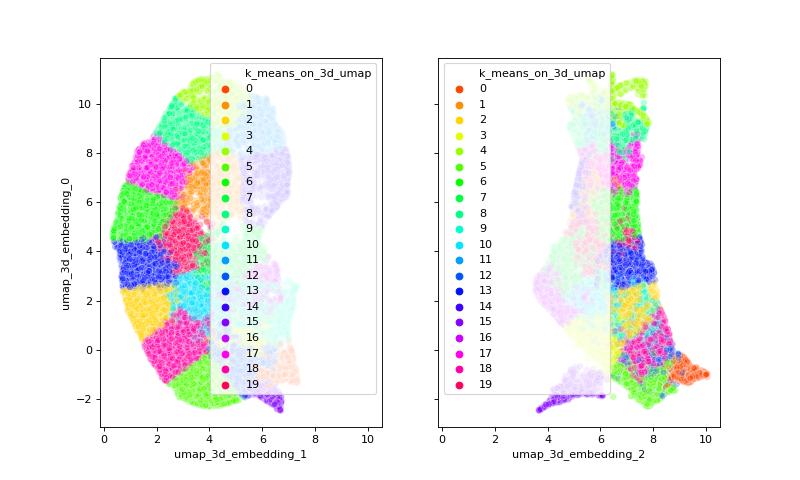

In [10]:
fig,ax=plt.subplots(1,2,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_3d_embedding_1', 
    y='umap_3d_embedding_0',
    hue='k_means_on_3d_umap',
    palette=sns.color_palette("hsv", len(rsp['k_means_on_3d_umap'].unique())),
    data=rsp,
    legend='full',
    alpha=0.3,
    ax=ax[0],
)
sns.scatterplot(
    x='umap_3d_embedding_2', 
    y='umap_3d_embedding_0',
    hue='k_means_on_3d_umap',
    palette=sns.color_palette("hsv", len(rsp['k_means_on_3d_umap'].unique())),
    data=rsp,
    legend='full',
    alpha=0.3,
    ax=ax[1],
)

## visualize in 3d using plotly

In [11]:
fig = px.scatter_3d(
    rsp, 
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1', 
    z='umap_3d_embedding_2',
    color='k_means_on_3d_umap',
    color_continuous_scale='hsv',
)

# optional view positioning parameters (I don't really understand these, just toying with them to get a view I like!)
camera = dict(
    up=dict(x=3, y=1.75, z=0.25),
    eye=dict(x=1.5, y=1.5, z=-0.2)
)

fig.update_layout(
    scene_camera=camera,
    margin=dict(l=30, r=30, t=10, b=10),
    width=1200,
    height=1000,
)
fig.write_html("/home/dougo/code/dougollerenshaw.github.io/figures_to_share/2020.08.21_k_means_on_umap.html")
fig.show()

# A little bit of prep for plotting

## first define the dominant dropout in each cluster

In [12]:
# identify dominant dropouts for each cluster
gat.identify_dominant_dropouts(rsp, cluster_column_name='k_means_on_3d_umap', cols_to_search=cols_for_clustering)

## define heatmap parameters
lots here, but there are lots of options!

In [13]:
cols_to_plot = [
    'all-images', 
    'omissions', 
    'pupil', 
    'running',
    'cre_line_categorical', 
    'session_id_categorical', 
    'k_means_on_3d_umap', 
    'equipment_name_categorical',
    'targeted_structure_categorical',
    'imaging_depth'
]

# make sure there's a heatmap definition for every column, otherwise the column will plot without a heatmap!
heatmap_defs = [
    {
        'columns':cols_to_plot[:4],
        'cbar_label':'fraction change\nin var explained',
        'cbar_ticks':[-1,0,1],
        'vmin':-1,
        'vmax':1,
        'cmap':'bwr',
    },
    {
        'columns':['cre_line_categorical'],
        'cbar_label':'cre_line',
        'cbar_ticks':[0,1,2],
        'cbar_ticklabels':np.sort(np.unique(rsp['cre_line'])),
        'vmin':-0.5,
        'vmax':2.5,
        'cmap':sns.color_palette("hls", 3),
    },
    {
        'columns':['session_id_categorical'],
        'cbar_label':'session ID',
        'cbar_ticks':[0,1,2,3],
        'cbar_ticklabels':[1,3,4,6],
        'vmin':-0.5,
        'vmax':3.5,
        'cmap':sns.color_palette("Dark2", 4),
    },
    {
        'columns':['k_means_on_3d_umap'],
        'cbar_label':'k-means label',
        'cbar_ticks':np.arange(0,20,2),
        'vmin':0,
        'vmax':19,
        'cmap':sns.color_palette("hsv", 20),
    },
    {
        'columns':['equipment_name_categorical'],
        'cbar_label':'equipment name',
        'cbar_ticks':np.arange(len(rsp['equipment_name_categorical'].unique())),
        'cbar_ticklabels':np.sort(np.unique(rsp['equipment_name'])),
        'vmin':-0.5,
        'vmax':len(rsp['equipment_name_categorical'].unique())-0.5,
        'cmap':sns.color_palette("hls", len(rsp['equipment_name_categorical'].unique())),
    },
    {
        'columns':['targeted_structure_categorical'],
        'cbar_label':'targeted structure',
        'cbar_ticks':np.arange(len(rsp['targeted_structure_categorical'].unique())),
        'cbar_ticklabels':np.sort(np.unique(rsp['targeted_structure'])),
        'vmin':-0.5,
        'vmax':len(rsp['targeted_structure'].unique())-0.5,
        'cmap':sns.color_palette("hls", len(rsp['targeted_structure'].unique())),
    },
    {
        'columns':['imaging_depth'],
        'cbar_label':'imaging_depth',
        'cbar_ticks':[0,100,200,300,400],
        'vmin':0,
        'vmax':400,
        'cmap':'magma',
    },
]

# Make heatmaps, sort by whatever we want
Note that it only makes sense to nest sorting values for categorical data. Any sorting value that follows a continuous variable will not have any effect.

## First sort by dominant dropout, the median value of the dominant dropout (for cases with multiple clusters sharing the same dominant dropout), then cre_line, session_id, imaging_depth

<IPython.core.display.Javascript object>


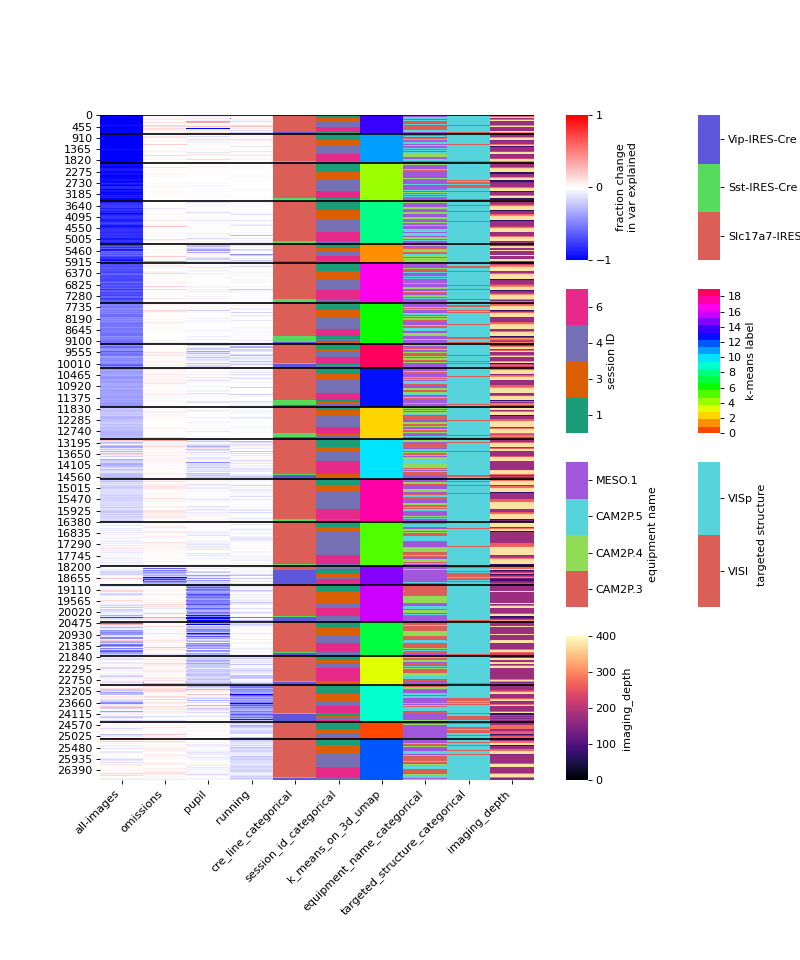

In [14]:
sort_order = ['dominant_dropout','dominant_dropout_median','cre_line_categorical','session_id_categorical','imaging_depth',]
sorted_data = gat.sort_data(rsp, sort_order, cluster_column_name='k_means_on_3d_umap')

fig, axes = vbp.make_multi_cmap_heatmap(
    sorted_data[cols_to_plot], 
    heatmap_defs, 
    figsize=(10,12), 
    top_buffer=0, 
    bottom_buffer=0.1, 
    n_cbar_rows=4, 
    heatmap_div=0.7, 
)
for idx,row in sorted_data.query('cluster_transition').iterrows():
    axes['heatmap'].axhline(idx,color='black')

## another sorting, with imaging_depth being the emphasis

<IPython.core.display.Javascript object>


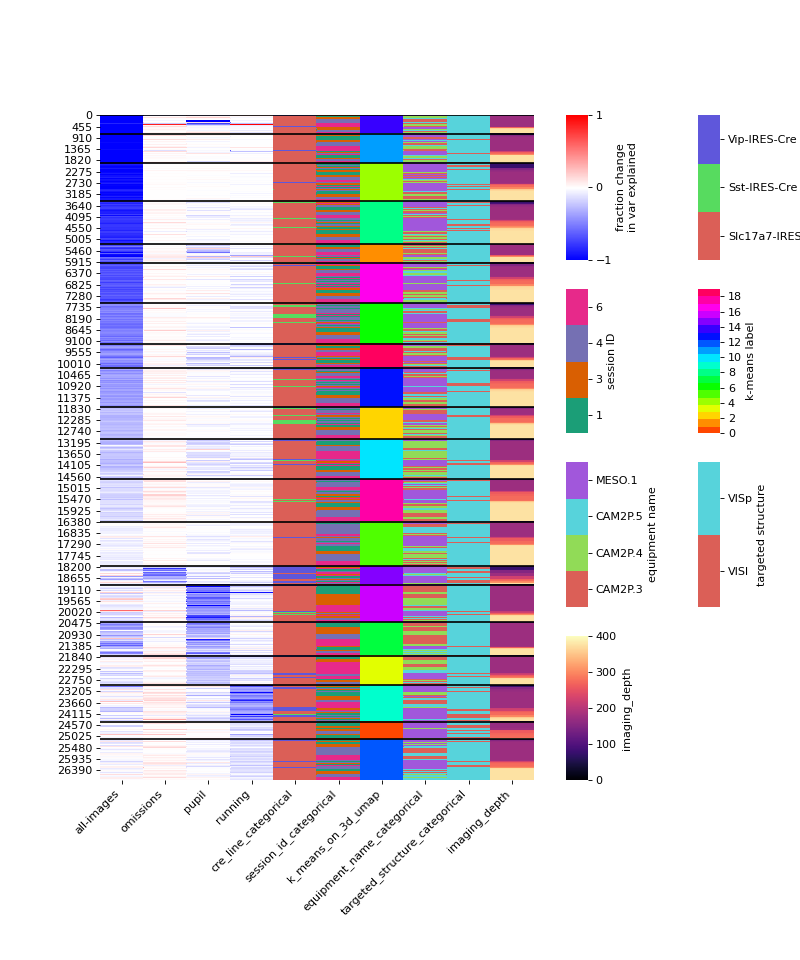

In [15]:
sort_order = ['dominant_dropout','dominant_dropout_median','imaging_depth','cre_line_categorical','session_id_categorical']
sorted_data = gat.sort_data(rsp, sort_order, cluster_column_name='k_means_on_3d_umap')

fig, axes = vbp.make_multi_cmap_heatmap(
    sorted_data[cols_to_plot], 
    heatmap_defs, 
    figsize=(10,12), 
    top_buffer=0, 
    bottom_buffer=0.1, 
    n_cbar_rows=4, 
    heatmap_div=0.7, 
)
for idx,row in sorted_data.query('cluster_transition').iterrows():
    axes['heatmap'].axhline(idx,color='black')

## and another sorting, with session_id being the emphasis

<IPython.core.display.Javascript object>


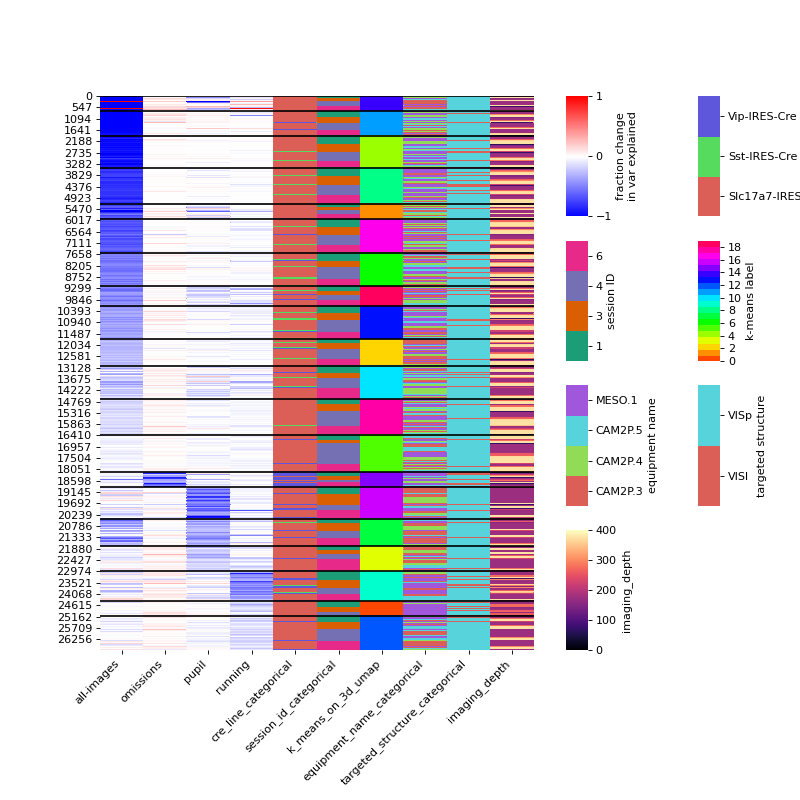

In [16]:
sort_order = ['dominant_dropout','dominant_dropout_median','session_id_categorical','cre_line_categorical','imaging_depth',]
sorted_data = gat.sort_data(rsp, sort_order, cluster_column_name='k_means_on_3d_umap')

fig, axes = vbp.make_multi_cmap_heatmap(
    sorted_data[cols_to_plot], 
    heatmap_defs, 
    figsize=(10,10), 
    top_buffer=0, 
    bottom_buffer=0.1, 
    n_cbar_rows=4, 
    heatmap_div=0.7, 
)
for idx,row in sorted_data.query('cluster_transition').iterrows():
    axes['heatmap'].axhline(idx,color='black')

## sort by structure after dropout

<IPython.core.display.Javascript object>


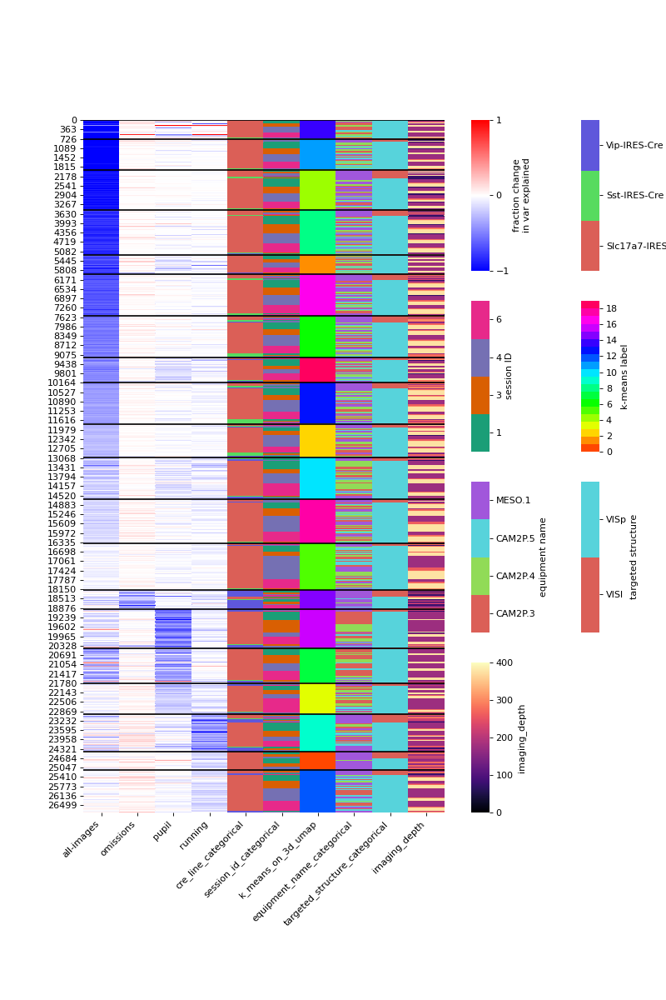

In [17]:
sort_order = ['dominant_dropout','dominant_dropout_median','targeted_structure_categorical','cre_line_categorical','session_id_categorical','imaging_depth']
sorted_data = gat.sort_data(rsp, sort_order, cluster_column_name='k_means_on_3d_umap')

fig, axes = vbp.make_multi_cmap_heatmap(
    sorted_data[cols_to_plot], 
    heatmap_defs, 
    figsize=(10,15), 
    top_buffer=0, 
    bottom_buffer=0.1, 
    n_cbar_rows=4, 
    heatmap_div=0.7, 
)
for idx,row in sorted_data.query('cluster_transition').iterrows():
    axes['heatmap'].axhline(idx,color='black')

## Sort by cluster ID and move it to the leftmost column

<IPython.core.display.Javascript object>


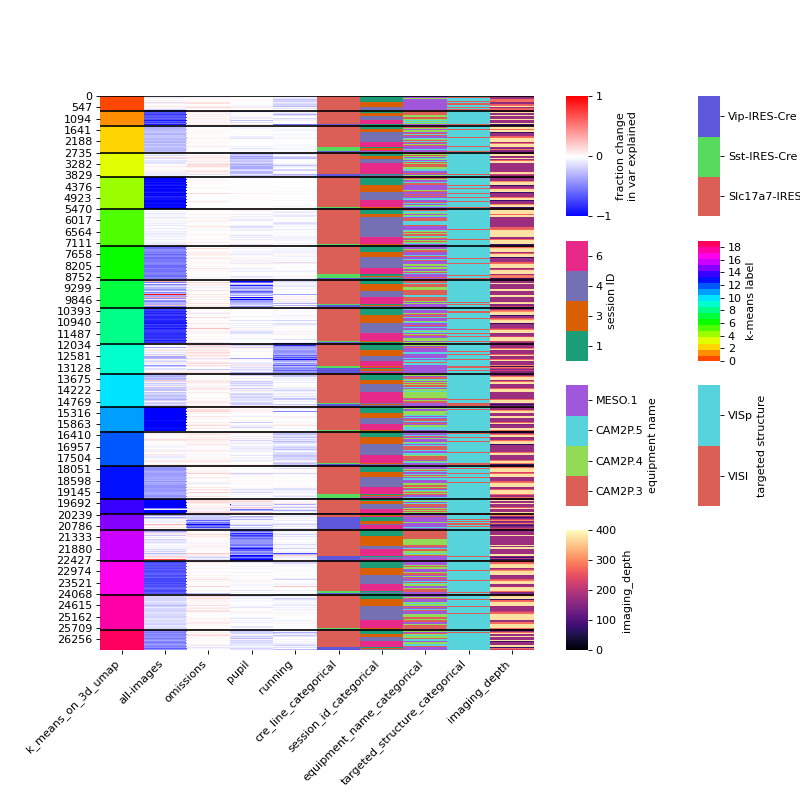

In [18]:
sort_order = ['k_means_on_3d_umap','cre_line_categorical','session_id_categorical','imaging_depth']
sorted_data = gat.sort_data(rsp, sort_order, cluster_column_name='k_means_on_3d_umap')

cols_to_plot = [
    'k_means_on_3d_umap', 
    'all-images', 
    'omissions', 
    'pupil', 
    'running',
    'cre_line_categorical', 
    'session_id_categorical', 
    'equipment_name_categorical',
    'targeted_structure_categorical',
    'imaging_depth'
]

fig, axes = vbp.make_multi_cmap_heatmap(
    sorted_data[cols_to_plot], 
    heatmap_defs, 
    figsize=(10,10), 
    top_buffer=0, 
    bottom_buffer=0.1, 
    n_cbar_rows=4, 
    heatmap_div=0.7, 
)
for idx,row in sorted_data.query('cluster_transition').iterrows():
    axes['heatmap'].axhline(idx,color='black')

## add pie charts for each cluster

Doc for pandas pie charts:
https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.pie.html  

Note: It'd probably be better to normalize the values in the pie charts by their total number in in the dataset. For example, since there are far more Slc cells, they dominate every pie chart.

<IPython.core.display.Javascript object>


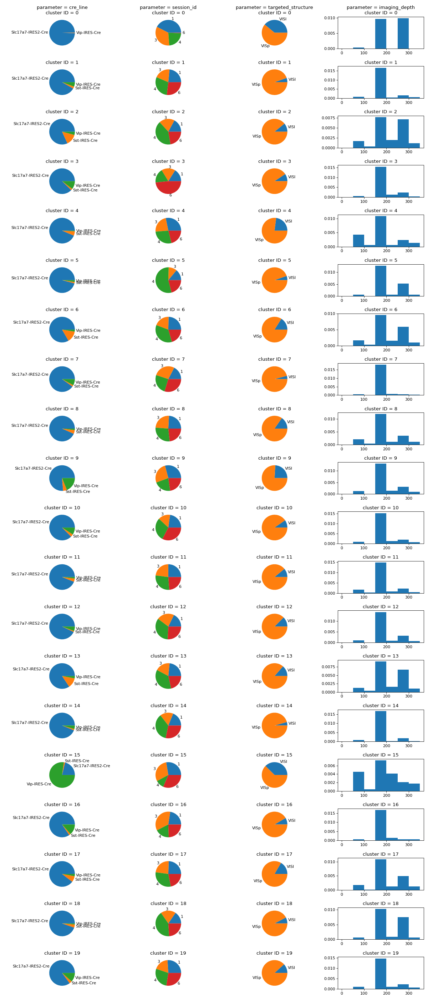

In [69]:
fig,ax = plt.subplots(20,4,figsize=(15,35))

parameters = ['cre_line','session_id','targeted_structure', 'imaging_depth']

for row,cluster_id in enumerate(sorted_data['k_means_on_3d_umap'].unique()):
    for col,parameter in enumerate(parameters):
        # make a histogram of imaging depths
        if parameter == 'imaging_depth':
            ax[row,col].hist(
                sorted_data.query('k_means_on_3d_umap == @cluster_id')['imaging_depth'],
                bins=np.arange(0,400,50),
                density=True
            )
            
        # make a pie chart for the rest
        else:
            # build a dataframe of value counts for the pie chart (there's probably a better way!)
            df = pd.DataFrame(sorted_data.query('k_means_on_3d_umap == @cluster_id')[parameter].value_counts()).sort_index()
            plot = df.plot.pie(
                y=parameter, 
                ax = ax[row,col],
                legend = False
            )
            ax[row,col].set_ylabel('')
        
        # set titles, make first row title different
        if row == 0:
            ax[row, col].set_title('parameter = {}\ncluster ID = {}'.format(parameter, cluster_id))
        else:
            ax[row, col].set_title('cluster ID = {}'.format(cluster_id))
            
            
fig.tight_layout()